# Phase 1

Install Required Packages

In [2]:
!pip install -q ultralytics tqdm opencv-python-headless matplotlib pyyaml

Create Project Folder Structure

In [144]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
import seaborn as sns
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import cv2
from collections import defaultdict
import numpy as np
from pathlib import Path
from ultralytics import YOLO
from scipy.ndimage import gaussian_filter 
import random


In [4]:
from pathlib import Path

PROJECT_ROOT = Path('./kitti_phase1')
EXTRACT_DIR = PROJECT_ROOT / 'kitti_extracted'   # kept for parity with original notebook
YOLO_DIR = PROJECT_ROOT / 'kitti_yolo'

for d in [EXTRACT_DIR, YOLO_DIR]:
    d.mkdir(parents=True, exist_ok=True)

(YOLO_IMAGES_TRAIN := YOLO_DIR / 'images' / 'train').mkdir(parents=True, exist_ok=True)
(YOLO_LABELS_TRAIN := YOLO_DIR / 'labels' / 'train').mkdir(parents=True, exist_ok=True)
(YOLO_IMAGES_VAL   := YOLO_DIR / 'images' / 'val').mkdir(parents=True, exist_ok=True)
(YOLO_LABELS_VAL   := YOLO_DIR / 'labels' / 'val').mkdir(parents=True, exist_ok=True)

PROJECT_ROOT, EXTRACT_DIR, YOLO_DIR

(PosixPath('kitti_phase1'),
 PosixPath('kitti_phase1/kitti_extracted'),
 PosixPath('kitti_phase1/kitti_yolo'))

Select KITTI Paths from Kaggle Input

In [5]:
from pathlib import Path

KAGGLE_KITTI = Path("/kaggle/input/kitti-dataset")

# You asked specifically to work only with these subfolders:
TRAIN_IMAGES_DIR = KAGGLE_KITTI / "data_object_image_2" / "training" / "image_2"
TEST_IMAGES_DIR  = KAGGLE_KITTI / "data_object_image_2" / "testing" / "image_2"
LABELS_DIR       = KAGGLE_KITTI / "data_object_label_2" / "training" / "label_2"

# For the cleaning/conversion pipeline we operate on the TRAIN images that have labels.
IMAGES_DIR = TRAIN_IMAGES_DIR

print("Train images folder:", TRAIN_IMAGES_DIR)
print("Test  images folder:", TEST_IMAGES_DIR)
print("Labels folder      :", LABELS_DIR)
print("Number of TRAIN images:", len(list(TRAIN_IMAGES_DIR.glob('*.png'))))
print("Number of TEST  images:", len(list(TEST_IMAGES_DIR.glob('*.png'))))
print("Number of TRAIN labels:", len(list(LABELS_DIR.glob('*.txt'))))

Train images folder: /kaggle/input/kitti-dataset/data_object_image_2/training/image_2
Test  images folder: /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2
Labels folder      : /kaggle/input/kitti-dataset/data_object_label_2/training/label_2
Number of TRAIN images: 7481
Number of TEST  images: 7518
Number of TRAIN labels: 7481


Define Image and Label Directories, Preview a Sample Image, and Preview the Matching Label File

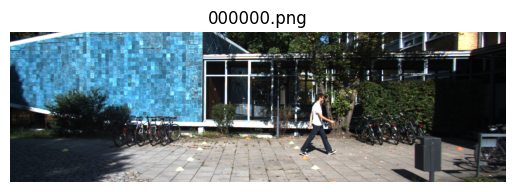

Label file: 000000.txt
Pedestrian 0.00 0 -0.20 712.40 143.00 810.73 307.92 1.89 0.48 1.20 1.84 1.47 8.41 0.01


In [6]:
import cv2, matplotlib.pyplot as plt

sample_img_path = sorted(IMAGES_DIR.glob('*.png'))[0]
img = cv2.cvtColor(cv2.imread(str(sample_img_path)), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off')
plt.title(sample_img_path.name)
plt.show()

sample_lbl_path = LABELS_DIR / (sample_img_path.stem + '.txt')
print("Label file:", sample_lbl_path.name)
print("\n".join(open(sample_lbl_path).read().splitlines()[:10]))

Check for Missing or Empty Labels

In [7]:
from tqdm import tqdm

images = sorted(IMAGES_DIR.glob('*.png'))
labels = sorted(LABELS_DIR.glob('*.txt'))
img_set = {p.stem for p in images}
lbl_set = {p.stem for p in labels}

imgs_without_lbl = [p for p in images if p.stem not in lbl_set]
lbl_without_imgs = [p for p in labels if p.stem not in img_set]
empty_label_files = [p for p in labels if p.stat().st_size == 0]

print("Images without label:", len(imgs_without_lbl))
print("Labels without image:", len(lbl_without_imgs))
print("Empty label files:", len(empty_label_files))

Images without label: 0
Labels without image: 0
Empty label files: 0


Remove Missing/Empty Label Files

In [8]:
valid_labels = {p.stem for p in labels if p.stat().st_size > 0}
images = [p for p in images if p.stem in valid_labels]  # keep images with non-empty label
print("Usable images after removing missing/empty labels:", len(images))

CLEAN_REPORT = {
    "imgs_without_lbl": [p.name for p in imgs_without_lbl],
    "lbl_without_imgs": [p.name for p in lbl_without_imgs],
    "empty_label_files": [p.name for p in empty_label_files],
}

Usable images after removing missing/empty labels: 7481


Remove Duplicate Images

In [9]:
# --- Robust duplicate detection on Kaggle FUSE (handles Errno 512) ---
import hashlib, time, os

def file_md5_resilient(path, chunk=1<<20, retries=3, pause=0.3):
    """MD5 with small retries to tolerate transient FUSE read errors."""
    for attempt in range(1, retries+1):
        try:
            h = hashlib.md5()
            with open(path, "rb") as f:
                while True:
                    data = f.read(chunk)
                    if not data:
                        break
                    h.update(data)
            return h.hexdigest()
        except OSError as e:
            if attempt == retries:
                raise
            time.sleep(pause)
    return None  # should not reach

hash_seen = set()
unique_images = []
dupe_images = []
unreadable_images = []

for p in images:
    try:
        h = file_md5_resilient(p)
        if h in hash_seen:
            dupe_images.append(p)
        else:
            hash_seen.add(h)
            unique_images.append(p)
    except OSError as e:
        # Skip files that the FUSE mount refuses to read; log for report
        unreadable_images.append(p)

# keep only readable, non-duplicate files
images = unique_images

print("Removed duplicate images:", len(dupe_images))
print("Skipped unreadable images (FUSE error):", len(unreadable_images))

CLEAN_REPORT["duplicate_images"]  = [p.name for p in dupe_images]
CLEAN_REPORT["unreadable_images"] = [p.name for p in unreadable_images]

Removed duplicate images: 0
Skipped unreadable images (FUSE error): 0


Visualize Bounding Boxes on a Sample Image

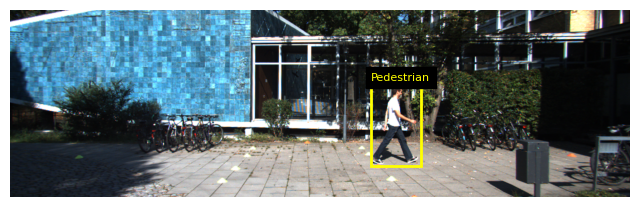

In [10]:
import matplotlib.patches as patches

def read_kitti_objects(lbl_path):
    objs = []
    for line in open(lbl_path).read().splitlines():
        parts = line.split()
        if len(parts) < 8:
            continue
        cls = parts[0]
        try:
            x1, y1, x2, y2 = map(float, parts[4:8])
            objs.append({'cls': cls, 'bbox': [x1, y1, x2, y2]})
        except:
            continue
    return objs

fig, ax = plt.subplots(figsize=(8,5))
ax.imshow(img)
ax.axis('off')

objs = read_kitti_objects(sample_lbl_path)
for o in objs[:10]:
    x1, y1, x2, y2 = o['bbox']
    rect = patches.Rectangle((x1,y1), x2-x1, y2-y1, linewidth=2, edgecolor='yellow', facecolor='none')
    ax.add_patch(rect)
    ax.text(x1, y1-3, o['cls'], fontsize=8, color='yellow', backgroundcolor='black')
plt.show()

Define Classes and Label Conversion Functions

In [11]:
CLASSES = ['Car', 'Pedestrian', 'Cyclist']
CLASS_TO_ID = {c:i for i,c in enumerate(CLASSES)}

def kitti_to_yolo_bbox(x1, y1, x2, y2, W, H):
    x_center = ((x1 + x2) / 2.0) / W
    y_center = ((y1 + y2) / 2.0) / H
    w = (x2 - x1) / W
    h = (y2 - y1) / H
    return x_center, y_center, w, h

Convert KITTI Labels to YOLO Format with Outlier Filtering

In [12]:
def convert_file_to_yolo(img_path, lbl_path):
    import cv2, math
    H, W = cv2.imread(str(img_path)).shape[:2]
    lines_out = []
    min_area_frac = 1e-5      # drop boxes smaller than this fraction of image area
    max_area_frac = 0.8       # drop boxes that cover almost whole image
    max_aspect = 20.0         # drop boxes with extreme aspect ratio

    for line in open(lbl_path).read().splitlines():
        parts = line.split()
        if len(parts) < 8:
            continue
        cls = parts[0]
        if cls not in CLASS_TO_ID:
            continue

        x1, y1, x2, y2 = map(float, parts[4:8])
        # clamp to image bounds
        x1, y1 = max(0.0, x1), max(0.0, y1)
        x2, y2 = min(float(W-1), x2), min(float(H-1), y2)
        if x2 <= x1 or y2 <= y1:
            continue

        # outlier checks
        bw, bh = (x2 - x1), (y2 - y1)
        area_frac = (bw * bh) / float(W * H)
        aspect = max(bw / max(bh,1e-6), bh / max(bw,1e-6))
        if area_frac < min_area_frac or area_frac > max_area_frac or aspect > max_aspect:
            continue

        xc = ((x1 + x2) / 2.0) / W
        yc = ((y1 + y2) / 2.0) / H
        w  = bw / W
        h  = bh / H
        if w <= 0 or h <= 0:
            continue

        lines_out.append(f"{CLASS_TO_ID[cls]} {xc:.6f} {yc:.6f} {w:.6f} {h:.6f}")
    return lines_out

Split Dataset into Train (80%) and Validation (20%)

In [13]:
import random, shutil
random.seed(42)

usable_images = [p for p in images if (LABELS_DIR / (p.stem + '.txt')).exists()]
random.shuffle(usable_images)

split_idx = int(0.8 * len(usable_images))
train_imgs = usable_images[:split_idx]
val_imgs = usable_images[split_idx:]

def process_split(img_paths, images_out_dir, labels_out_dir):
    images_out_dir.mkdir(parents=True, exist_ok=True)
    labels_out_dir.mkdir(parents=True, exist_ok=True)
    kept, skipped = 0, 0
    for ip in tqdm(img_paths):
        lp = LABELS_DIR / (ip.stem + '.txt')
        lines = convert_file_to_yolo(ip, lp)
        if len(lines) == 0:
            skipped += 1
            continue
        shutil.copy2(ip, images_out_dir / ip.name)
        with open(labels_out_dir / (ip.stem + '.txt'), 'w') as f:
            f.write('\n'.join(lines) + '\n')
        kept += 1
    return kept, skipped

kept_tr, skip_tr = process_split(train_imgs, YOLO_IMAGES_TRAIN, YOLO_LABELS_TRAIN)
kept_va, skip_va = process_split(val_imgs, YOLO_IMAGES_VAL, YOLO_LABELS_VAL)

print({'train_kept': kept_tr, 'train_skipped': skip_tr, 'val_kept': kept_va, 'val_skipped': skip_va})

100%|██████████| 1497/1497 [00:25<00:00, 59.40it/s]

{'train_kept': 5984, 'train_skipped': 0, 'val_kept': 1497, 'val_skipped': 0}


Write YOLO Data Configuration (data.yaml)

In [14]:
import yaml

data_yaml = {
    'path': str(YOLO_DIR.resolve()),
    'train': 'images/train',
    'val': 'images/val',
    'names': CLASSES,
}
with open(YOLO_DIR / 'data.yaml', 'w') as f:
    yaml.safe_dump(data_yaml, f, sort_keys=False)
print((YOLO_DIR / 'data.yaml').read_text())

path: /kaggle/working/kitti_phase1/kitti_yolo
train: images/train
val: images/val
names:
- Car
- Pedestrian
- Cyclist



Count Train/Val Images and Labels and Package Final YOLO Dataset as ZIP

In [15]:
n_tr_img = len(list((YOLO_IMAGES_TRAIN).glob('*.png')))
n_tr_lbl = len(list((YOLO_LABELS_TRAIN).glob('*.txt')))
n_va_img = len(list((YOLO_IMAGES_VAL).glob('*.png')))
n_va_lbl = len(list((YOLO_LABELS_VAL).glob('*.txt')))

print('Train images:', n_tr_img, '| Train labels:', n_tr_lbl)
print('Val images  :', n_va_img, '| Val labels  :', n_va_lbl)

import shutil
zip_path = PROJECT_ROOT / 'kitti_yolo_prepared.zip'
if zip_path.exists(): zip_path.unlink()
shutil.make_archive(str(zip_path.with_suffix('')), 'zip', root_dir=YOLO_DIR)
print("ZIP written to:", zip_path.resolve())

Train images: 5984 | Train labels: 5984
Val images  : 1497 | Val labels  : 1497
ZIP written to: /kaggle/working/kitti_phase1/kitti_yolo_prepared.zip


Save Cleaning Report as JSON

In [16]:
import json
CLEAN_REPORT.update({
    "train_kept": kept_tr, "train_skipped": skip_tr,
    "val_kept": kept_va,   "val_skipped": skip_va
})
with open(PROJECT_ROOT / "cleaning_report.json", "w") as f:
    json.dump(CLEAN_REPORT, f, indent=2)
print("Saved cleaning_report.json")

Saved cleaning_report.json


# Phase 2

Load YOLO Dataset Metadata

In [17]:
from pathlib import Path
import pandas as pd

YOLO_DIR = Path("/kaggle/working/kitti_phase1/kitti_yolo")

train_images = sorted((YOLO_DIR / "images" / "train").glob("*.png"))
train_labels = sorted((YOLO_DIR / "labels" / "train").glob("*.txt"))
val_images   = sorted((YOLO_DIR / "images" / "val").glob("*.png"))
val_labels   = sorted((YOLO_DIR / "labels" / "val").glob("*.txt"))

print("Train images:", len(train_images), "Train labels:", len(train_labels))
print("Val images  :", len(val_images), "Val labels  :", len(val_labels))

Train images: 5984 Train labels: 5984
Val images  : 1497 Val labels  : 1497


Parse YOLO Label Files into DataFrame

In [18]:
import numpy as np

records = []
for lbl in train_labels + val_labels:
    split = "train" if "train" in str(lbl) else "val"
    for line in open(lbl).read().splitlines():
        cls, xc, yc, w, h = line.split()
        records.append({
            "split": split,
            "image": lbl.stem + ".png",
            "class_id": int(cls),
            "x_center": float(xc),
            "y_center": float(yc),
            "width": float(w),
            "height": float(h),
        })

df = pd.DataFrame(records)

In [19]:
df.head()



,split,image,class_id,x_center,y_center,width,height
0,train,000000.png,1,0.622194,0.609351,0.080335,0.445730
1,train,000001.png,0,0.326667,0.512880,0.029130,0.057547
2,train,000001.png,2,0.549750,0.477173,0.009968,0.079947
3,train,000002.png,0,0.546481,0.551360,0.034364,0.088693
4,train,000005.png,1,0.278112,0.556507,0.024726,0.159733


In [20]:
print("Dataset size:", len(df))
print("Number of unique images:", df["image"].nunique())
print("Classes:", df["class_id"].unique())
print("Class counts:\n", df["class_id"].value_counts())


Dataset size: 34842
Number of unique images: 7481
Classes: [1 0 2]
Class counts:
 class_id
0    28731
1     4484
2     1627
Name: count, dtype: int64


# Class Diversity per Image

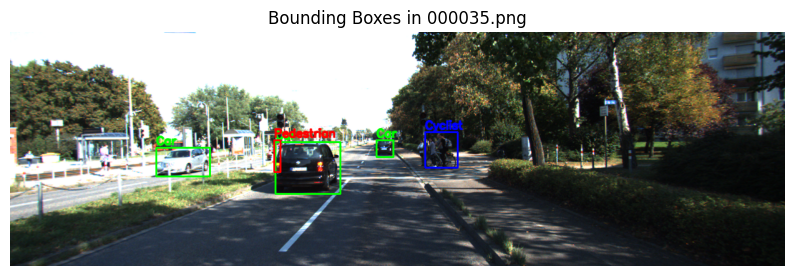

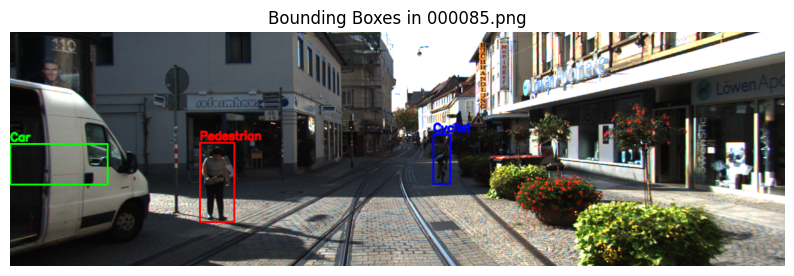

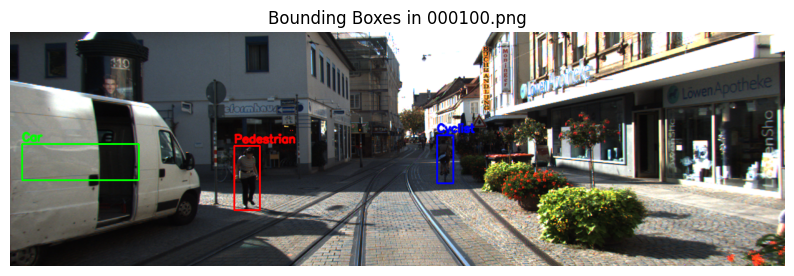

In [92]:
diverse_imgs = df.groupby("image")["class_id"].nunique()
diverse_imgs = diverse_imgs[diverse_imgs==3].index

for img_name in diverse_imgs[:3]:
    show_image_with_bboxes(img_name, df, str(IMAGES_DIR))


# Class Distribution 

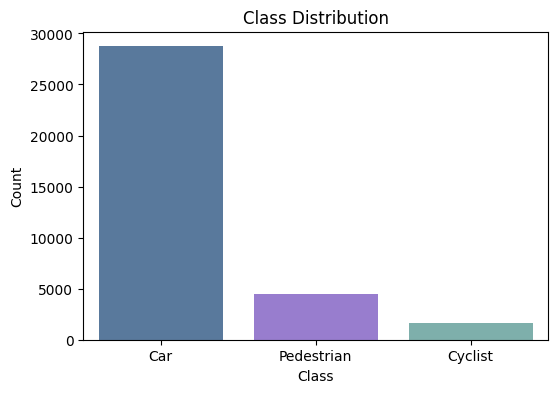

In [91]:
plt.figure(figsize=(6,4))
sns.countplot(data=df,x="class_id",palette={0: "#4E79A7",1: "#9370DB",2: "#76B7B2"})
plt.xticks([0,1,2], ['Car','Pedestrian','Cyclist'])
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()


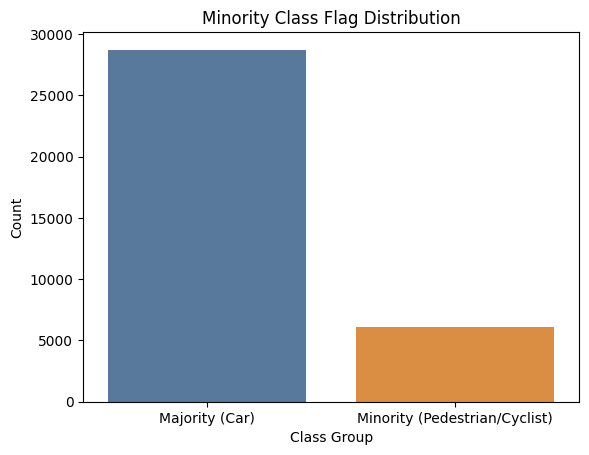

In [90]:
df["is_minority"] = df["class_id"].apply(lambda x: 1 if x in [1,2] else 0)

sns.countplot(data=df,x="is_minority",palette={0: "#4E79A7",1: "#F28E2B"} )
plt.xticks([0,1], ["Majority (Car)", "Minority (Pedestrian/Cyclist)"])
plt.title("Minority Class Flag Distribution")
plt.xlabel("Class Group")
plt.ylabel("Count")
plt.show()


# # Train vs Validation 

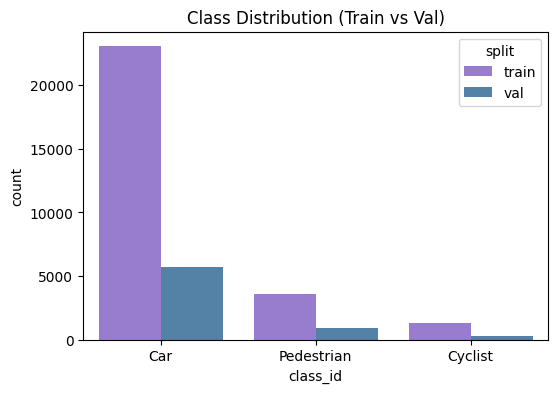

In [89]:
plt.figure(figsize=(6,4))
sns.countplot(data=df,x="class_id",hue="split",palette=["#9370DB", "#4682B4"])
plt.xticks([0,1,2], ['Car','Pedestrian','Cyclist'])
plt.title("Class Distribution (Train vs Val)")
plt.show()


# Bounding Box Derived Features

In [74]:
df["bbox_area"] = df["width"] * df["height"]
df["aspect_ratio"] = df["width"] / df["height"]


In [75]:
df.head()


,split,image,class_id,x_center,y_center,width,height,bbox_area,aspect_ratio
0,train,000000.png,1,0.622194,0.609351,0.080335,0.445730,0.035808,0.180232
1,train,000001.png,0,0.326667,0.512880,0.029130,0.057547,0.001676,0.506195
2,train,000001.png,2,0.549750,0.477173,0.009968,0.079947,0.000797,0.124683
3,train,000002.png,0,0.546481,0.551360,0.034364,0.088693,0.003048,0.387449
4,train,000005.png,1,0.278112,0.556507,0.024726,0.159733,0.003950,0.154796


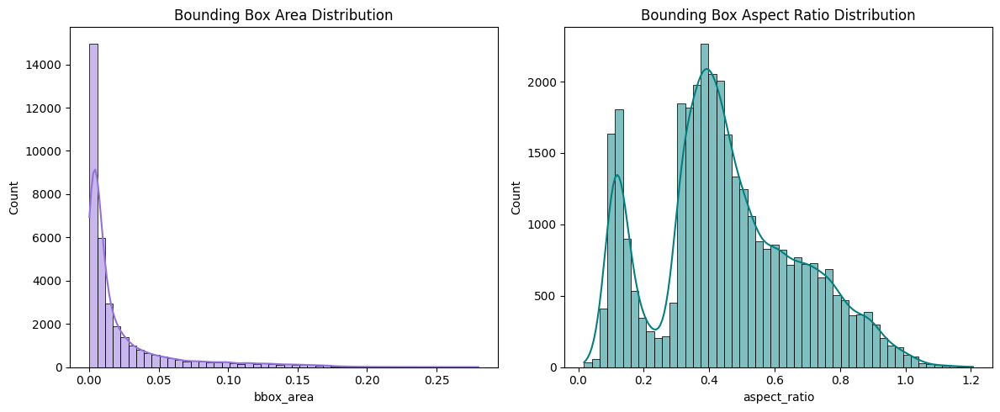

In [76]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df["bbox_area"],bins=50,kde=True,color="#9370DB",edgecolor="black")

plt.title("Bounding Box Area Distribution")

plt.subplot(1,2,2)
sns.histplot(df["aspect_ratio"],bins=50,kde=True,color="#008080",edgecolor="black")
plt.title("Bounding Box Aspect Ratio Distribution")

plt.tight_layout()
plt.show()


# Bounding Box Visualization 

In [77]:
def show_image_with_bboxes(image_name, df, images_dir):
    sub = df[df["image"] == image_name]
    img_path = os.path.join(images_dir, image_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img.shape

    for _, row in sub.iterrows():
        x, y, bw, bh = row["x_center"], row["y_center"], row["width"], row["height"]
        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)

        cls = row["class_id"]
        color = (0,255,0) if cls==0 else (255,0,0) if cls==1 else (0,0,255)
        label = "Car" if cls==0 else "Pedestrian" if cls==1 else "Cyclist"

        cv2.rectangle(img, (x1,y1), (x2,y2), color, 2)
        cv2.putText(img, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, color, 2, cv2.LINE_AA)

    plt.figure(figsize=(10,6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Bounding Boxes in {image_name}")
    plt.show()


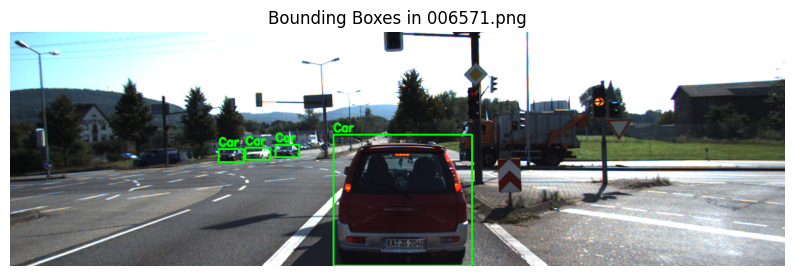

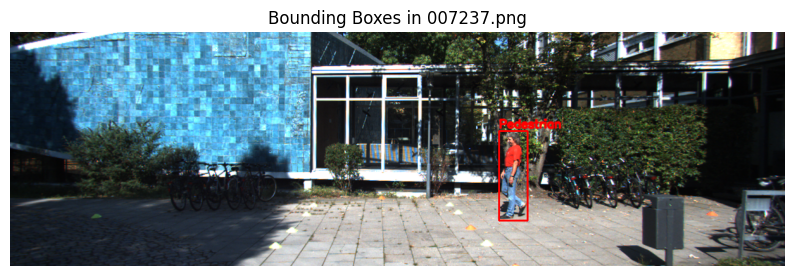

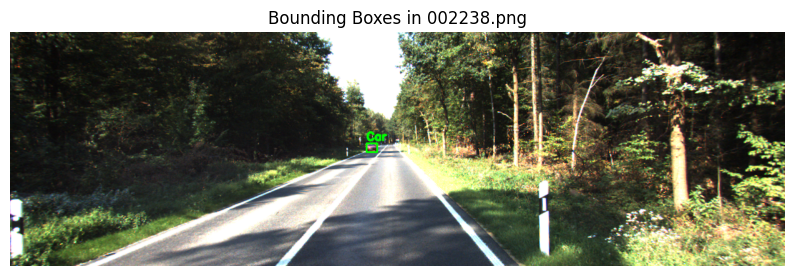

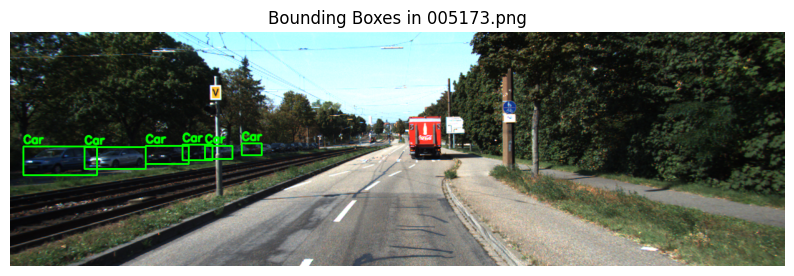

In [78]:
import random
for img_name in random.sample(df['image'].unique().tolist(), 4):
    show_image_with_bboxes(img_name, df, str(IMAGES_DIR))




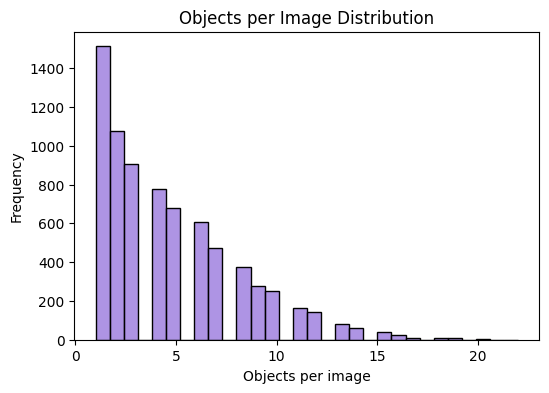

Avg objects per image: 4.657398743483491
Max objects in an image: 22


In [79]:
objs_per_img = df.groupby("image")["class_id"].count().reset_index(name="num_objects")

plt.figure(figsize=(6,4))
sns.histplot(objs_per_img["num_objects"],bins=30,color="#9370DB",edgecolor="black")
plt.title("Objects per Image Distribution")
plt.xlabel("Objects per image")
plt.ylabel("Frequency")
plt.show()

print("Avg objects per image:", objs_per_img["num_objects"].mean())
print("Max objects in an image:", objs_per_img["num_objects"].max())


# Bounding Box Area per Class

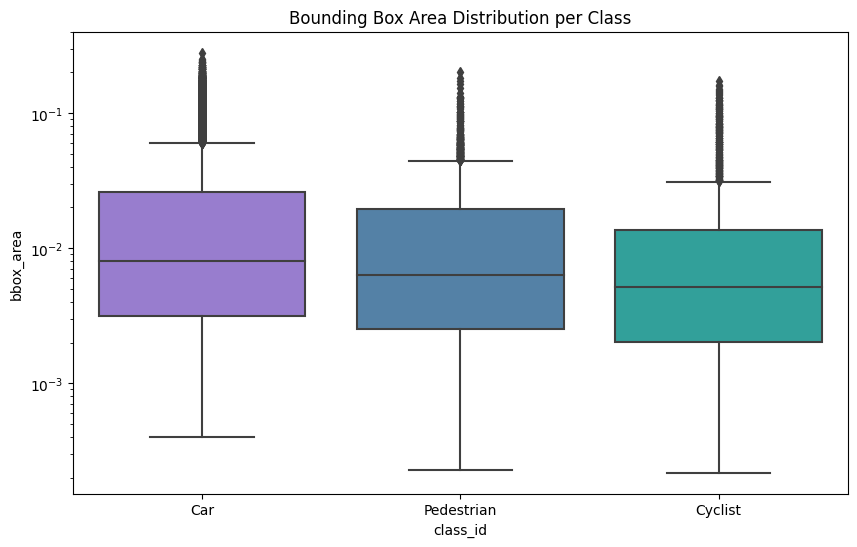

In [80]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df,x="class_id",y="bbox_area",palette={0: "#9370DB",1: "#4682B4",2: "#20B2AA"})

plt.xticks([0,1,2], ['Car','Pedestrian','Cyclist'])
plt.yscale("log")  
plt.title("Bounding Box Area Distribution per Class")
plt.show()


# Object Center Heatmaps 

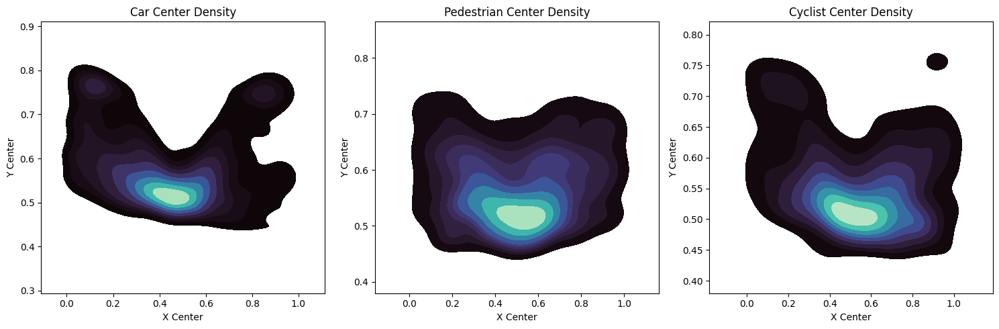

In [81]:
plt.figure(figsize=(15,5))

for i, cls in enumerate(['Car','Pedestrian','Cyclist']):
    plt.subplot(1,3,i+1)
    subset = df[df["class_id"]==i]
    sns.kdeplot(x=subset["x_center"], y=subset["y_center"], cmap="mako", fill=True, thresh=0.05)
    plt.title(f"{cls} Center Density")
    plt.xlabel("X Center")
    plt.ylabel("Y Center")

plt.tight_layout()
plt.show()


# Combined Object Center Heatmap

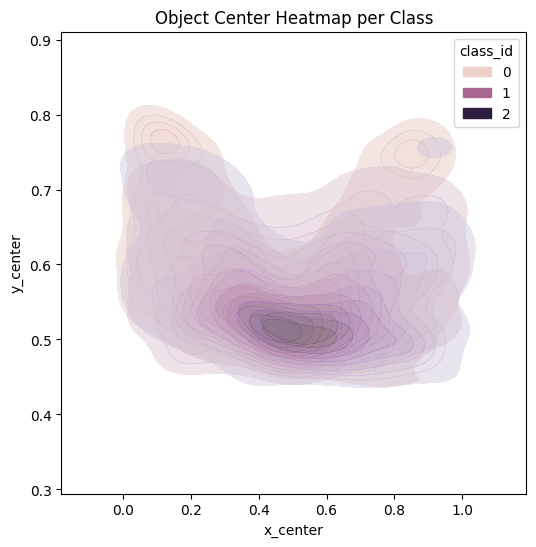

In [82]:
plt.figure(figsize=(6,6))
sns.kdeplot(
    data=df, x="x_center", y="y_center",
    hue="class_id", fill=True, common_norm=False, alpha=0.4
)
plt.title("Object Center Heatmap per Class")
plt.show()


# Visualizing Object Centers on Random Images 

In [83]:
def show_object_centers(image_name, df, images_dir): 
    sub = df[df["image"] == image_name]
    img_path = os.path.join(images_dir, image_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img.shape

    plt.imshow(img)
    for _, row in sub.iterrows():
        cx = int(row["x_center"] * w)
        cy = int(row["y_center"] * h)
        cls = row["class_id"]

        color = "lime" if cls==0 else "orange" if cls==1 else "red"
        label = "Car" if cls==0 else "Pedestrian" if cls==1 else "Cyclist"

        plt.scatter(cx, cy, c=color, s=50, edgecolors="black")

    plt.title(f"Object Centers in {image_name}")
    plt.axis("off")


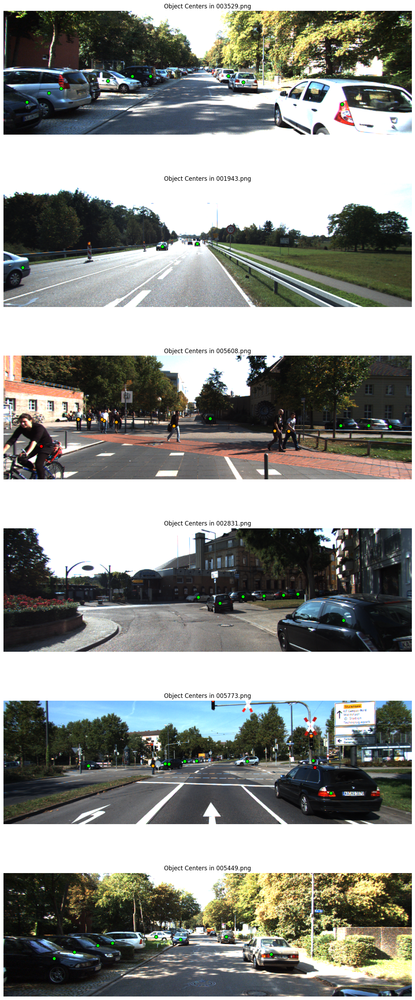

In [84]:
random_imgs = df["image"].drop_duplicates().sample(6, random_state=42).tolist()

plt.figure(figsize=(12, 30))  
for i, img_name in enumerate(random_imgs, 1):
    plt.subplot(6, 1, i)  
    show_object_centers(img_name, df, str(IMAGES_DIR))

plt.tight_layout()
plt.show()

# Crowded Images & Rare Classes 

In [85]:
class_diversity = df.groupby("image")["class_id"].nunique().reset_index()
class_diversity.rename(columns={"class_id": "num_classes"}, inplace=True)
top_imgs = objs_per_img.sort_values("num_objects", ascending=False).head(5)
print("\nTop crowded images:\n", top_imgs)

rare_class_imgs = class_diversity[class_diversity["num_classes"] == 1]
print("\nImages with only one class:", len(rare_class_imgs))



Top crowded images:
            image  num_objects
4139  004139.png           22
5663  005663.png           21
6422  006422.png           20
3219  003219.png           20
4747  004747.png           20

Images with only one class: 5642


In [86]:
def show_image_with_stats(image_name, df, images_dir):
    sub = df[df["image"] == image_name]
    img_path = os.path.join(images_dir, image_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img.shape
    for _, row in sub.iterrows():
        x, y, bw, bh = row["x_center"], row["y_center"], row["width"], row["height"]
        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)

        cls = row["class_id"]
        color = (0,255,0) if cls==0 else (255,0,0) if cls==1 else (0,0,255)
        label = "Car" if cls==0 else "Pedestrian" if cls==1 else "Cyclist"

        cv2.rectangle(img, (x1,y1), (x2,y2), color, 2)
        cv2.putText(img, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 
                    0.6, color, 2, cv2.LINE_AA)

    counts = sub["class_id"].value_counts().to_dict()
    num_cars = counts.get(0, 0)
    num_pedestrians = counts.get(1, 0)
    num_cyclists = counts.get(2, 0)
    total_objects = len(sub)

    plt.figure(figsize=(8,6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Image: {image_name} | Total: {total_objects} | Cars: {num_cars} | Pedestrians: {num_pedestrians} | Cyclists: {num_cyclists}")
    plt.show()

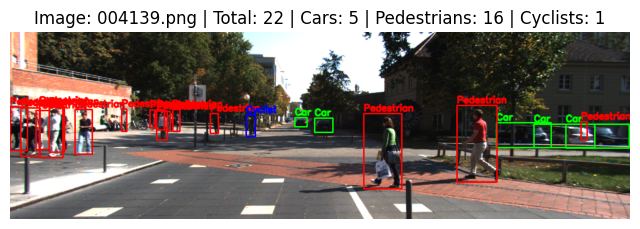

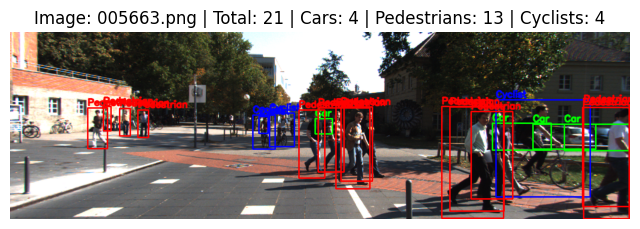

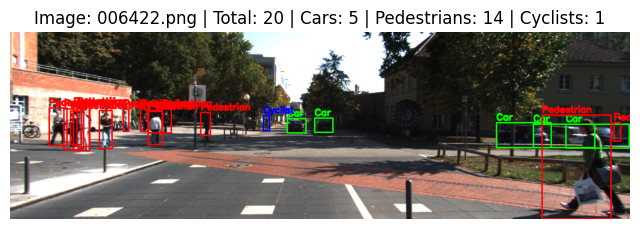

In [87]:
top_imgs = objs_per_img.sort_values("num_objects", ascending=False).head(3)
for img_name in top_imgs["image"]:
    show_image_with_stats(img_name, df, str(IMAGES_DIR))

# Summary

In [88]:
print("Total images:", df["image"].nunique())
print("Total objects:", len(df))

print("\nObjects per class:\n", df["class_id"].value_counts())
print("\nAvg objects per image:", objs_per_img["num_objects"].mean())
print("Max objects in an image:", objs_per_img["num_objects"].max())

print("\nClass diversity per image:\n", class_diversity["num_classes"].value_counts().sort_index())


Total images: 7481
Total objects: 34842

Objects per class:
 class_id
0    28731
1     4484
2     1627
Name: count, dtype: int64

Avg objects per image: 4.657398743483491
Max objects in an image: 22

Class diversity per image:
 num_classes
1    5642
2    1555
3     284
Name: count, dtype: int64


# Handling Classes to Make It Balanced 

In [44]:
from sklearn.utils import resample

df_clean = df.dropna(subset=["class_id"]).copy()

df_filtered = df_clean[df_clean["class_id"].isin([0, 1, 2])]

car_df = df_filtered[df_filtered["class_id"] == 0]
ped_df = df_filtered[df_filtered["class_id"] == 1]
cyc_df = df_filtered[df_filtered["class_id"] == 2]

print("Before balancing:")
print(df_filtered["class_id"].value_counts())

target_size = len(car_df)

ped_upsampled = resample(
    ped_df, replace=True,
    n_samples=target_size, random_state=42
)
cyc_upsampled = resample(
    cyc_df, replace=True,
    n_samples=target_size, random_state=42
)

df_balanced = pd.concat([car_df, ped_upsampled, cyc_upsampled]).reset_index(drop=True)

print("\nAfter balancing:")
print(df_balanced["class_id"].value_counts())
print("Balanced dataset size:", len(df_balanced))


Before balancing:
class_id
0    28731
1     4484
2     1627
Name: count, dtype: int64

After balancing:
class_id
0    28731
1    28731
2    28731
Name: count, dtype: int64
Balanced dataset size: 86193


In [32]:
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(df_balanced, test_size=0.2, stratify=df_balanced["class_id"], random_state=42)

print("Train size:", len(train_df))
print("Validation size:", len(val_df))
print("Train class distribution:\n", train_df["class_id"].value_counts())
print("Val class distribution:\n", val_df["class_id"].value_counts())


Train size: 68954
Validation size: 17239
Train class distribution:
 class_id
1    22985
0    22985
2    22984
Name: count, dtype: int64
Val class distribution:
 class_id
2    5747
0    5746
1    5746
Name: count, dtype: int64


In [56]:
import shutil
from pathlib import Path
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
import yaml
import random

def prepare_and_train_yolov8(df_balanced,
                             orig_images_dir: Path,
                             balanced_root_dir: Path,
                             train_val_split: float = 0.2,
                             sample_fraction: float = 1.0,
                             epochs: int = 50,
                             batch_size: int = 16,
                             img_size: int = 640,
                             device: int = 0):

    img_train_dir = balanced_root_dir / "images" / "train"
    lbl_train_dir = balanced_root_dir / "labels" / "train"
    img_val_dir = balanced_root_dir / "images" / "val"
    lbl_val_dir = balanced_root_dir / "labels" / "val"
    for folder in [img_train_dir, lbl_train_dir, img_val_dir, lbl_val_dir]:
        folder.mkdir(parents=True, exist_ok=True)

    unique_images = df_balanced["image"].unique()
    train_imgs, val_imgs = train_test_split(unique_images, test_size=train_val_split, random_state=42, shuffle=True)

    random.seed(42)
    train_imgs = random.sample(train_imgs.tolist(), int(len(train_imgs) * sample_fraction))
    val_imgs = random.sample(val_imgs.tolist(), int(len(val_imgs) * sample_fraction))

    grouped = df_balanced.groupby("image")

    def yolo_format(row):
        return f"{row['class_id']} {row['x_center']:.6f} {row['y_center']:.6f} {row['width']:.6f} {row['height']:.6f}"

    def copy_and_write(images, img_dir, lbl_dir):
        for img_name in images:
            shutil.copy2(orig_images_dir / img_name, img_dir / img_name)
            labels = []
            if img_name in grouped.groups:
                labels = [yolo_format(row) for _, row in grouped.get_group(img_name).iterrows()]
            with open(lbl_dir / (Path(img_name).stem + ".txt"), "w") as f:
                f.writelines(line + "\n" for line in labels)

    copy_and_write(train_imgs, img_train_dir, lbl_train_dir)
    copy_and_write(val_imgs, img_val_dir, lbl_val_dir)

    print(f"Prepared {len(train_imgs)} train and {len(val_imgs)} val images with labels.")
    data_yaml = {
        'path': str(balanced_root_dir.resolve()),
        'train': 'images/train',
        'val': 'images/val',
        'names': ['Car', 'Pedestrian', 'Cyclist']
    }
    with open(balanced_root_dir / "data.yaml", 'w') as f:
        yaml.safe_dump(data_yaml, f, sort_keys=False)
    print(f"Saved data.yaml at {balanced_root_dir / 'data.yaml'}")

# Model training with duplicates removed

In [63]:
from pathlib import Path
from ultralytics import YOLO

balanced_root_dir = Path("./kitti_balanced_yolo")
epochs = 5
batch_size = 16
device = 0
img_size = 640  


In [93]:
results = model.train(
    data=str(balanced_root_dir / "data.yaml"),
    epochs=epochs,
    batch=batch_size,
    imgsz=img_size,
    device=device,
    flipud=0.5,
    fliplr=0.5,
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    project="runs/train",       
    name="kitti_yolov8",       
    exist_ok=True             
)


Ultralytics 8.3.203 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=kitti_balanced_yolo/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/kaggle/working/yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=kitti_yolov8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        449       1930      0.682      0.616      0.669      0.418
                   Car        404       1589      0.779      0.859      0.899      0.658
            Pedestrian        107        270      0.733      0.538      0.619      0.326
               Cyclist         54         71      0.536      0.451       0.49      0.271
Speed: 0.1ms preprocess, 1.3ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /kaggle/working/runs/train/kitti_yolov8


# Evaluation 

In [94]:
eval_results = model.val()  
print(eval_results)

Ultralytics 8.3.203 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4085.3±884.4 MB/s, size: 824.0 KB)
val: Scanning /kaggle/working/kitti_balanced_yolo/labels/val.cache... 449 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 449/449 1.1Mit/s 0.0s0s
val: /kaggle/working/kitti_balanced_yolo/images/val/000058.png: 4 duplicate labels removed
val: /kaggle/working/kitti_balanced_yolo/images/val/000073.png: 78 duplicate labels removed
val: /kaggle/working/kitti_balanced_yolo/images/val/000087.png: 1 duplicate labels removed
val: /kaggle/working/kitti_balanced_yolo/images/val/000108.png: 26 duplicate labels removed
val: /kaggle/working/kitti_balanced_yolo/images/val/000401.png: 16 duplicate labels removed
val: /kaggle/working/kitti_balanced_yolo/images/val/000424.png: 20 duplicate labels removed
val: /kaggle/working/kitti_balanced_yolo/images/v

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        449       1930      0.681      0.618      0.669      0.419
                   Car        404       1589       0.78       0.86      0.899      0.659
            Pedestrian        107        270      0.728      0.545      0.618      0.328
               Cyclist         54         71      0.535      0.451      0.491       0.27
Speed: 0.5ms preprocess, 2.1ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to /kaggle/working/runs/train/kitti_yolov8
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cac227395d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.01

In [69]:
test_results = model.predict(source="/kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000001.png", conf=0.5, save=True)



image 1/1 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000001.png: 224x640 3 Cars, 8.1ms
Speed: 1.5ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 224, 640)
Results saved to /kaggle/working/runs/detect/train24


# Count objects in the predicted images Predicted 

In [100]:
results = model.predict(
    source="/kaggle/input/kitti-dataset/data_object_image_2/testing/image_2",
    conf=0.5,
    save=True,
    stream=True 
)

from collections import defaultdict
import numpy as np

class_names = ["Car", "Pedestrian", "Cyclist"]
total_counts = defaultdict(int)
for i, r in enumerate(results):
    if i >= 5:
        break
    classes = r.boxes.cls.cpu().numpy()
    print(f"Image {i+1}:")
    image_counts = defaultdict(int)
    for cls_id in classes:
        cls_name = class_names[int(cls_id)]
        image_counts[cls_name] += 1
        total_counts[cls_name] += 1
    print("  Counts in this image:", dict(image_counts))

print("\nTotal predicted object counts (first 5 images):")
for cls, count in total_counts.items():
    print(f"{cls}: {count}")



image 1/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000000.png: 224x640 1 Car, 10.8ms
Image 1:
  Counts in this image: {'Car': 1}
image 2/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000001.png: 224x640 3 Cars, 9.9ms
Image 2:
  Counts in this image: {'Car': 3}
image 3/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000002.png: 224x640 6 Cars, 9.6ms
Image 3:
  Counts in this image: {'Car': 6}
image 4/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000003.png: 224x640 3 Cars, 9.3ms
Image 4:
  Counts in this image: {'Car': 3}
image 5/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000004.png: 224x640 1 Car, 9.1ms
Image 5:
  Counts in this image: {'Car': 1}
image 6/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000005.png: 224x640 5 Cars, 9.8ms

Total predicted object counts (first 5 images):
Car: 14


# Visualize first 5 prediction images with counts 


image 1/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000000.png: 224x640 1 Car, 10.1ms


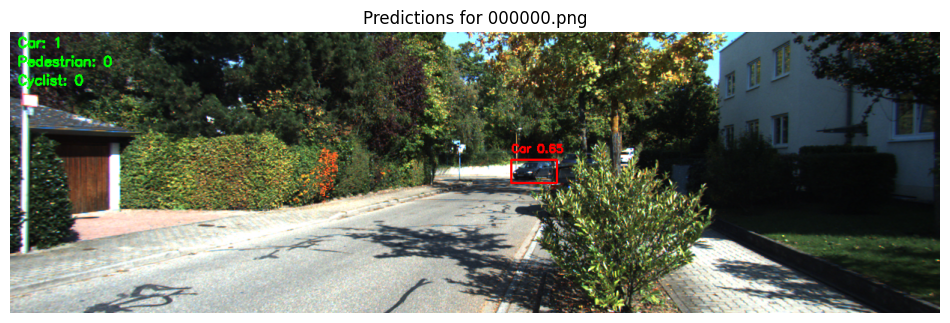

image 2/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000001.png: 224x640 3 Cars, 9.7ms


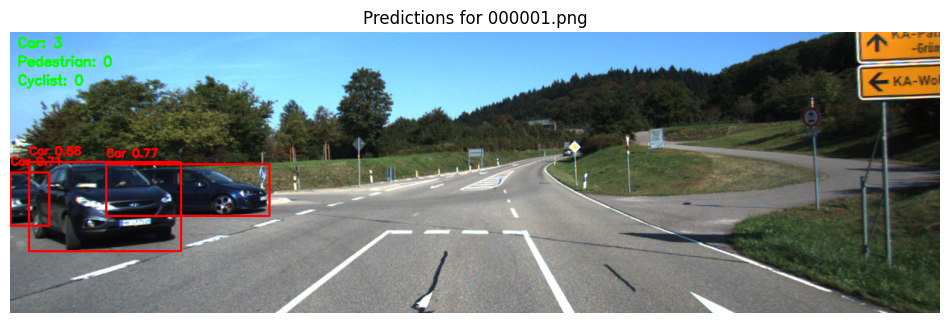

image 3/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000002.png: 224x640 6 Cars, 9.5ms


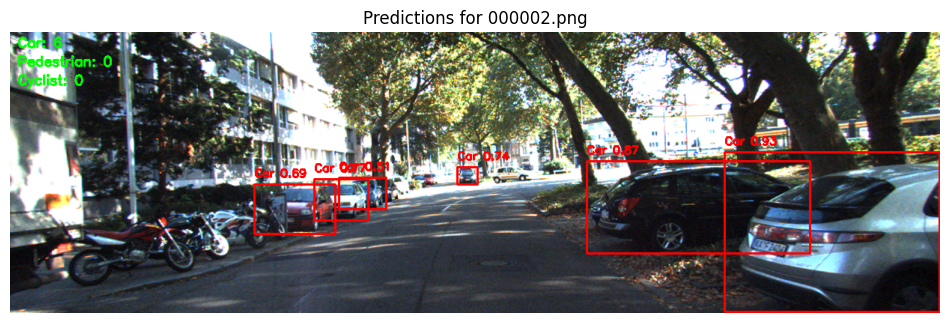

image 4/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000003.png: 224x640 3 Cars, 9.4ms


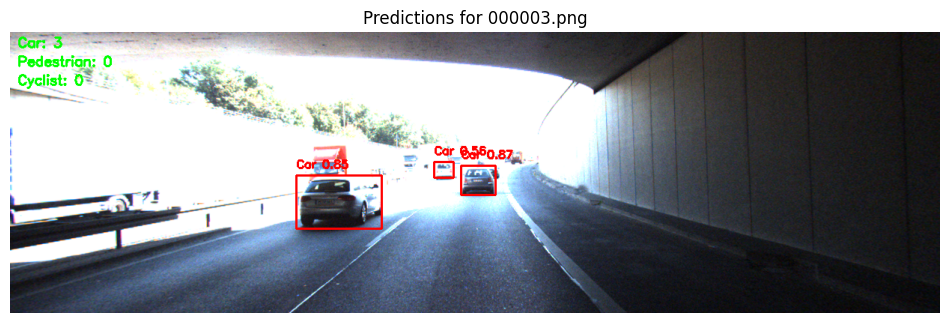

image 5/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000004.png: 224x640 1 Car, 9.6ms


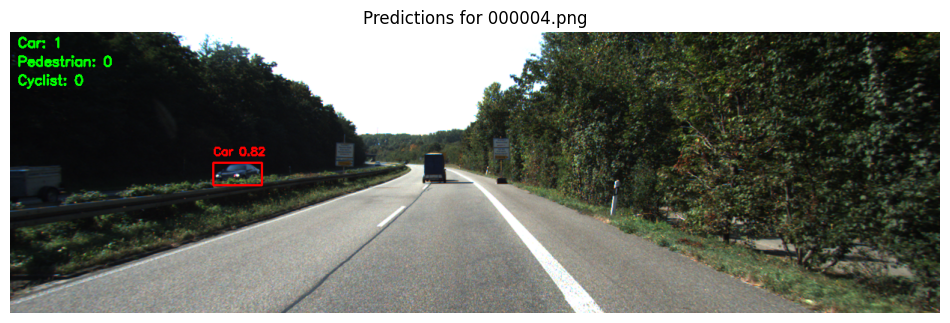

image 6/7518 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000005.png: 224x640 5 Cars, 10.4ms


In [112]:

model = YOLO("runs/train/kitti_yolov8/weights/best.pt")
test_images_dir = "/kaggle/input/kitti-dataset/data_object_image_2/testing/image_2"

class_names = ["Car", "Pedestrian", "Cyclist"]

results = model.predict(
    source=test_images_dir,
    conf=0.5,
    save=False, 
    stream=True
)

for i, r in enumerate(results):
    if i >= 5:
        break
    img_name = Path(r.path).name

    img = cv2.imread(str(r.path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image_counts = defaultdict(int)
    for box, cls_id, conf in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy(), r.boxes.conf.cpu().numpy()):
        x1, y1, x2, y2 = box.astype(int)
        cls_name = class_names[int(cls_id)]
        image_counts[cls_name] += 1
        label = f"{cls_name} {conf:.2f}"
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 2)

    y_offset = 20
    for cls_name in class_names:
        text = f"{cls_name}: {image_counts[cls_name]}"
        cv2.putText(img, text, (10, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)
        y_offset += 25

    plt.figure(figsize=(12,6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Predictions for {img_name}")
    plt.show()


# Confidence Heatmap Randomly sample 5 images


image 1/1 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/004409.png: 224x640 6 Cars, 10.1ms
Speed: 1.2ms preprocess, 10.1ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 640)


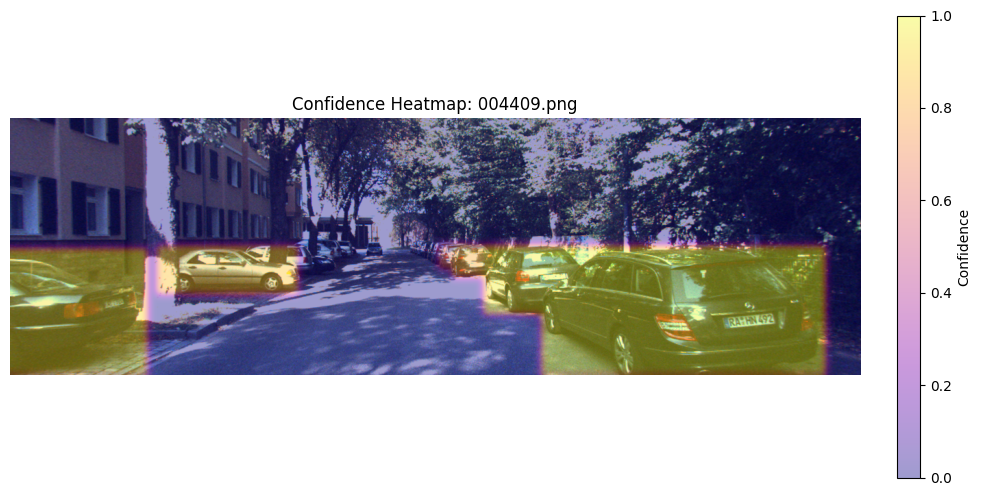


image 1/1 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/000520.png: 224x640 3 Cars, 9.8ms
Speed: 1.4ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 640)


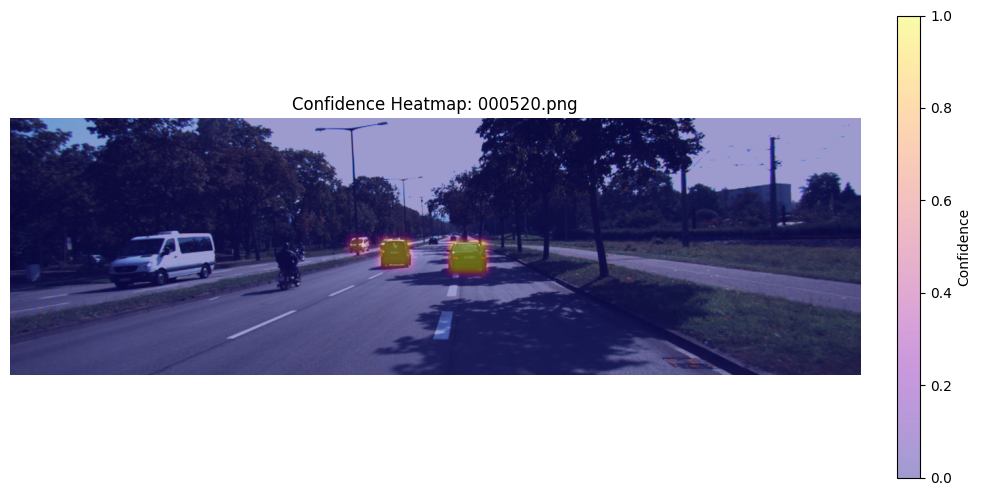


image 1/1 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/002246.png: 224x640 1 Pedestrian, 9.4ms
Speed: 1.3ms preprocess, 9.4ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 640)


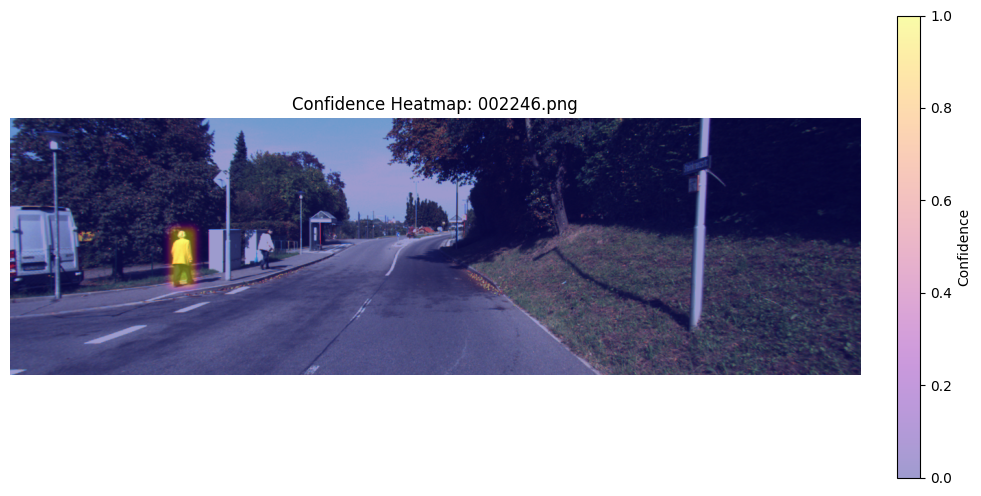


image 1/1 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/002389.png: 224x640 1 Pedestrian, 9.9ms
Speed: 1.3ms preprocess, 9.9ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 640)


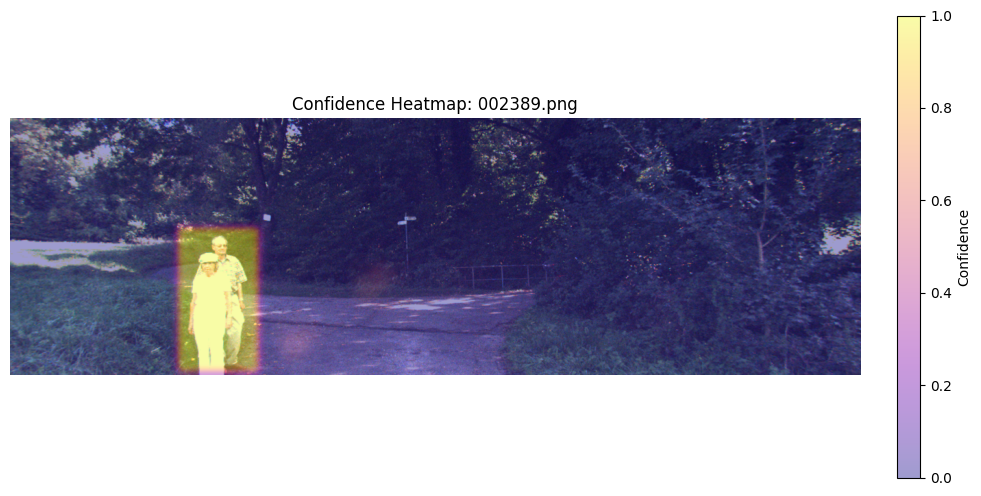


image 1/1 /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2/001948.png: 224x640 2 Cars, 9.5ms
Speed: 1.3ms preprocess, 9.5ms inference, 1.3ms postprocess per image at shape (1, 3, 224, 640)


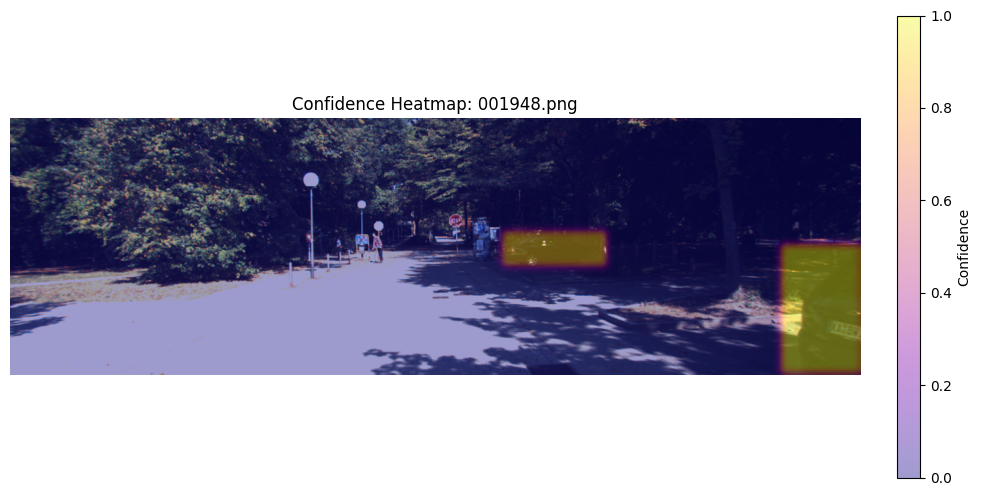

In [142]:
model = YOLO("runs/train/kitti_yolov8/weights/best.pt")
test_images_dir = Path("/kaggle/input/kitti-dataset/data_object_image_2/testing/image_2")
image_paths = list(test_images_dir.glob("*.png"))
sample_paths = random.sample(image_paths, 5)

class_names = ["Car", "Pedestrian", "Cyclist"]

for img_path in sample_paths:
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"Could not read image: {img_path}")
        continue

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    heatmap = np.zeros((img.shape[0], img.shape[1]), dtype=np.float32)

    results = model.predict(source=str(img_path), conf=0.5, save=False, stream=False)

    r = results[0]
    if hasattr(r, "boxes") and r.boxes is not None and len(r.boxes) > 0:
        boxes = r.boxes.xyxy.cpu().numpy()
        confs = r.boxes.conf.cpu().numpy()

        for box, conf in zip(boxes, confs):
            x1, y1, x2, y2 = box.astype(int)
            # Clip coordinates
            x1 = max(0, min(x1, img.shape[1] - 1))
            x2 = max(0, min(x2, img.shape[1] - 1))
            y1 = max(0, min(y1, img.shape[0] - 1))
            y2 = max(0, min(y2, img.shape[0] - 1))
            if x2 <= x1 or y2 <= y1:
                continue
            heatmap[y1:y2, x1:x2] = np.maximum(heatmap[y1:y2, x1:x2], conf)

    heatmap_norm = heatmap / (heatmap.max() + 1e-6)
    heatmap_smooth = gaussian_filter(heatmap_norm, sigma=5)

    plt.figure(figsize=(12, 6))
    plt.imshow(img_rgb)
    hmap = plt.imshow(heatmap_smooth, cmap='plasma', alpha=0.4, vmin=0, vmax=1)
    plt.axis("off")
    plt.title(f"Confidence Heatmap: {img_path.name}")
    plt.colorbar(hmap, fraction=0.046, pad=0.04, label='Confidence')
    plt.show()
